In [40]:
import json
import itertools
import re
import os
import pandas as pd
from urllib.parse import urlparse
# from haralyzer import HarParser, HarPage

# for tests of statistical significance
import numpy as np
import copy
import random
import statsmodels.stats.api as sms

In [42]:
with open('data/ios_signatures.json', encoding='utf-8') as fh:
    signatures = json.load(fh)
    
with open('data_processed/ios_trackers.json', encoding='utf-8') as fh:
    trackers = json.load(fh)

In [49]:
apps = {}
for app, v in trackers.items():
    entry = {}
    
    for signature in signatures:
        if signature['id'] in v:
            entry[signature['name']] = True

    apps[app] = entry

apps = pd.DataFrame.from_dict(apps, orient='index').fillna(False)
nontrackers = [
    "Twitter Account Kit",
    "Google Firebase",
    "Get device information",
    "AdID access",
    "Google Firebase Messaging",
    "Google Consent API",
    "YouTube",
    "Google Sign-In",
    "Google Maps",
    "Amazon AWS",
    "iAd"
]

included_trackers = [
    "Alipay",
    "Tencent Login",
    "Google AdMob",
    "Facebook",
    "Facebook Ads",
    "Facebook Analytics",
    "Google CrashLytics",
    "Google Analytics",
    "Inmobi",
    "Unity3d Ads",
    "Moat",
    "Twitter MoPub",
    "AppLovin (MAX and SparkLabs)",
    "ChartBoost",
    "AdColony",
    "Amazon Analytics (Amazon insights)",
    "HockeyApp",
    "Tapjoy",
    "Branch",
    "Microsoft Visual Studio App Center",            # iOS
    "Microsoft Visual Studio App Center Crashes",    # Android
    "Microsoft Visual Studio App Center Analytics",  # Android
    "Adobe Experience Cloud",
    "MixPanel",
    "Adjust",
    "Amplitude",
    "Heyzap (bought by Fyber)",
    "Amazon Advertisement",
    "Vungle",
    "AppsFlyer",
    "WeChat",          # iOS
    "Baidu",           # iOS + Android
    #"Baidu APPX",
    #"Baidu Location",
    "Baidu Map",
    "Baidu Mobile Ads",
    "Baidu Mobile Stat",
    #"Baidu Navigation",
    #"Umeng+",           # iOS + Android
    #"Umeng Analytics",
    #"Umeng Feedback",
    "JiGuang Aurora Mobile JPush",
    "Tencent",
    "Tencent Ads",
    "Tencent MTA",
    "Bugly",
    "Tencent Map LBS",
    "WeChat Location",
    "ironSource",
    "Startapp",
    "Google Tag Manager",
    "Pollfish",
    "Nexage",
    "Flurry",
    "Verizon Ads",
    "Revmob",
    "New Relic",
    "Supersonic Ads",
    "Appodeal",
    "Fyber",
    "Smaato",
    "Urbanairship",
    "MobFox",
    "Localytics",
    "Appcelerator Analytics",
    "AdBuddiz",
    "Radius Networks",
    "ComScore",
    "Soomla",
    "BugSense",
    "Yandex Ad",
    "Mail.ru",
    "Quantcast",
    "VKontakte SDK",
    "Batch",
    "Tapdaq",
    "Fyber SponsorPay",
    "Ooyala",
    "Google Firebase Analytics",
    "AdTech Mobile SDK",
    "PlayHaven",
    "WeiboSDK",
    #"Weibo",
    "AppMetrica",
    "Mintegral",
    "Ogury Presage",
    "Appnext",
    "myTarget",
    "CleverTap",
    "Sensors Analytics",
    "Braze (formerly Appboy)",
    "Bugsnag",
    "Kochava",
    "Pangle",
    "SKAdNetwork",
    "Google Play Services",
    "Umeng Analytics",
    "Umeng Social",
    "Mob.com",
    "Alibaba Cloud Utils",
    #"Alibaba Cloud Push",
    #"Alibaba Crash Reporting",
    "Alibaba AutoNavi",
    "Alibaba Analytics",
    "Yueying"
]

apps_nontrackers = apps[[col for col in apps if col not in included_trackers]]
apps_trackers = apps[[col for col in apps if col in included_trackers]]
#apps_trackers = apps_trackers.rename({'WeiboSDK': 'Weibo'}, axis = 1)
if "Tencent Ads" in apps_trackers.columns and "Tencent MTA" in apps_trackers.columns:
    apps_trackers["Tencent"] = apps_trackers["Tencent Ads"] | apps_trackers["Tencent MTA"]
    apps_trackers = apps_trackers.drop(['Tencent Ads', 'Tencent MTA'], axis=1)

#apps_nontrackers.mean() * 100
apps_trackers.sum().sum() / len(apps) # mean trackers per app

9.32

In [52]:
# apps_trackers.mean().sort_values(ascending=False)[0:20] * 100
apps

,Facebook,AdID access,Get device information,Google AdMob,Google Firebase,Google CrashLytics,Inmobi,Unity3d Ads,AppLovin (MAX and SparkLabs),Adjust,...,Tencent Ads,Mintegral,Appodeal,Soomla,Google Consent API,Baidu,Umeng+,Baidu Mobile Ads,Umeng Analytics,Yueying
com.apalonapps.wlf,True,True,True,True,True,True,True,True,True,True,...,False,False,False,False,False,False,False,False,False,False
com.elevateapp.elevate,True,True,True,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
com.carfax.ConsumerApp,True,True,True,False,True,True,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
com.duolingo.DuolingoMobile,True,True,True,True,True,True,False,True,False,True,...,False,False,False,False,False,False,False,False,False,False
com.dreamgames.royalmatch,True,True,True,True,True,True,False,True,False,False,...,False,False,False,False,False,False,False,False,False,False
com.master.hotelmaster,True,True,True,True,True,True,True,True,True,True,...,True,True,False,False,False,False,False,False,False,False
com.dpmapps.supernova,True,True,True,True,True,True,False,True,True,False,...,False,False,True,False,False,False,False,False,False,False
com.longhorn.countmasterevo,True,True,True,True,True,True,True,True,True,True,...,False,True,True,True,False,False,False,False,False,False
com.adengames.weaponcraftrun,True,True,True,True,True,True,True,True,True,True,...,False,True,True,False,False,False,False,False,False,False
com.vottzapps.wordle,True,True,True,True,True,True,True,True,True,True,...,False,True,True,False,False,False,False,False,False,False


In [88]:
import ast
ios = pd.read_csv("data/appsIos.csv", index_col = 0, converters={'permissions':ast.literal_eval, 'trackersettings':ast.literal_eval})
ios = ios[ios.index.isin(pd.read_csv('data_processed/ios_all_apps.csv').app)]

In [93]:
from sklearn.preprocessing import MultiLabelBinarizer
mlb = MultiLabelBinarizer()

def expand(df,col):
    return df.join(pd.DataFrame(mlb.fit_transform(df.get(col)),
                              columns=mlb.classes_,
                              index=df.index).astype(bool))

ios = expand(ios, 'trackersettings')

In [96]:
ios['AdID'].mean().round(3)*100

72.0

In [97]:
(apps_nontrackers.mean() * 100).round(1)

AdID access                   96.0
Get device information       100.0
Google Firebase               92.0
YouTube                      100.0
Amazon AWS                     4.0
Sentry                        20.0
iAd                           92.0
Google Sign-In                16.0
Google Firebase Messaging     20.0
Google Maps                    4.0
Google Consent API             4.0
Umeng+                         4.0
dtype: float64

In [98]:
(apps_nontrackers['AdID access'] & apps_trackers['AppsFlyer']).sum() / apps_trackers['AppsFlyer'].sum()

0.8333333333333334

In [99]:
(ios.permissions.explode().value_counts() / len(ios) * 100)[0:20].round(1).to_csv('data_processed/ios_top_permissions.csv')

             iOS
Motion      20.0
Contacts    24.0
Bluetooth   40.0
Calendar    56.0
Microphone  36.0
Location    92.0
Camera      48.0


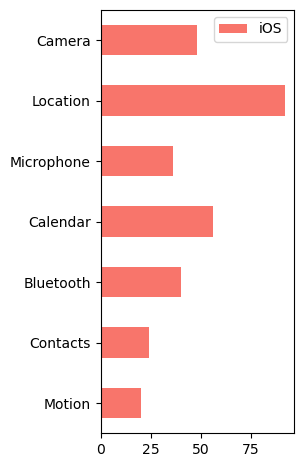

In [101]:
cross_platforms_perms = ['Motion', 'Contacts', 'Bluetooth', 'Calendar', 'Microphone', 'Location', 'Camera']
colors = ['#f8756b', '#00bdc2']
data = pd.DataFrame(
    {
        'iOS': ios[cross_platforms_perms].mean() * 100
    }
)
ax = data.plot.barh(color=colors, figsize=(2.5,5.5));
ax.figure.savefig('figures/ios-permissions.pdf', bbox_inches='tight');
print(data.round(1))

In [116]:
print(ios[ios.Calendar].permissions.apply(lambda x: "ios.permission.READ_CALENDAR" in x).mean().round(3) * 100)
print(ios[ios.Calendar].permissions.apply(lambda x: "ios.permission.WRITE_CALENDAR" in x).mean().round(3) * 100)
print(ios[ios.Contacts].permissions.apply(lambda x: "ios.permission.READ_CONTACTS" in x).mean().round(3) * 100)
print(ios[ios.Contacts].permissions.apply(lambda x: "ios.permission.WRITE_CONTACTS" in x).mean().round(3) * 100)

0.0
0.0
0.0
0.0


In [119]:
ad_trackers = ['Google AdMob', 'Unity3d Ads', 'Inmobi']
for ad_tracker in ad_trackers:
    print(ad_tracker)
    print(((apps_nontrackers['AdID access'] & apps_trackers[ad_tracker]).sum() / apps_trackers[ad_tracker].sum() * 100).round(1))

Google AdMob
100.0
Unity3d Ads
100.0
Inmobi
100.0


In [126]:
ad_trackers = ['Google AdMob', 'Unity3d Ads', 'Inmobi']
for ad_tracker in ad_trackers:
    print(ad_tracker)
    print(((apps_nontrackers['AdID access'] & apps_trackers[ad_tracker]).sum() / apps_nontrackers['AdID access'].sum() * 100).round(1))

Google AdMob
62.5
Unity3d Ads
37.5
Inmobi
20.8


In [140]:
companies = {
    "Google AdMob": "AdMob",
    "Facebook": "Facebook",
    "Google CrashLytics": "Crashlytics",
    "Google Analytics": "Google Analytics",
    "Inmobi": "InMobi",
    "Unity3d Ads": "Unity Technologies",
    "Moat": "Moat",
    "Twitter MoPub": "MoPub",
    "AppLovin (MAX and SparkLabs)": "AppLovin",
    "ChartBoost": "Chartboost",
    "AdColony": "AdColony",
    "Amazon Analytics (Amazon insights)": "Amazon Analytics",
    "HockeyApp": "Bit Stadium",
    "Tapjoy": "Tapjoy",
    "Branch": "Branch",
    "Microsoft Visual Studio App Center": "App Center",
    "Adobe Experience Cloud": "Adobe Experience Cloud",
    "MixPanel": "Mixpanel",
    "Adjust": "Adjust",
    "Amplitude": "Amplitude",
    "Heyzap (bought by Fyber)": "Heyzap",
    "Amazon Advertisement": "Amazon Advertising",
    "Vungle": "Vungle",
    "AppsFlyer": "AppsFlyer",
    "WeChat": "Tencent",
    "Baidu": "Baidu",
    "Umeng+": "Umeng+",
    "JiGuang Aurora Mobile JPush": "JPush",
    "Tencent MTA": "Tencent",
    "Bugly": "Tencent",
    "Tencent Map LBS": "Tencent",
    "WeChat Location": "Tencent",
    "ironSource": "ironSource",
    "Startapp": "StartApp",
    "Google Tag Manager": "Google Tag Manager",
    "Pollfish": "Pollfish",
    "Nexage": "NEXAGE",
    "Flurry": "Flurry",
    "Verizon Ads": "Verizon Media",
    "Revmob": "RevMob",
    "New Relic": "New Relic",
    "Supersonic Ads": "Supersonic Studios",
    "Appodeal": "Appodeal",
    "Fyber": "Fyber",
    "Smaato": "Smaato",
    "Urbanairship": "Airship",
    "MobFox": "Mobfox",
    "Localytics": "Localytics",
    "Appcelerator Analytics": "Appcelerator",
    "AdBuddiz": "AdBuddiz",
    "Radius Networks": "Radius Networks",
    "ComScore": "comScore",
    "Soomla": "Soomla",
    "BugSense": "BugSense",
    "Yandex Ad": "Yandex",
    "Mail.ru": "Mail.ru",
    "Quantcast": "Quantcast",
    "VKontakte SDK": "VKontakte",
    "Batch": "Batch",
    "Tapdaq": "Tapdaq",
    "Fyber SponsorPay": "Fyber",
    "Ooyala": "Ooyala - Flex Media Platform",
    "Google Firebase Analytics": "Firebase",
    "AdTech Mobile SDK": "AdTech",
    "PlayHaven": "PlayHaven",
    "iAd": "Apple",
    "WeiboSDK": "Weibo",
    "SKAdNetwork": "Apple",
    "CleverTap": "CleverTap",
    "Braze (formerly Appboy)": "Braze",
    "Bugsnag": "Bugsnag",
    "myTarget": "My.com",
    "Tencent": "Tencent",
    "Kochava": "Kochava",
    "Mintegral": "Mintegral",
    "Pangle": "Pangle",
    "AppMetrica": "Yandex",
    "Google Play Services": "Google",
    "Alipay": "Alibaba",
    "Baidu Map": "Baidu",
    "Baidu Mobile Stat": "Baidu",
    "Baidu Mobile Ads": "Baidu",
    "Umeng Analytics": "Umeng+",
    "Umeng Social": "Umeng+",
    "Mob.com": "MobTech",
    "Alibaba Cloud Utils": "Alibaba",
    "Alibaba Cloud Push": "Alibaba",
    "Alibaba Crash Reporting": "Alibaba",
    "Alibaba AutoNavi": "Alibaba",
    "Alibaba Analytics": "Alibaba",
    "Yueying": "Alibaba",
    'Tencent Login': 'Tencent',
    'Sensors Analytics': 'Sensors Data'
}

In [199]:
# Read the CSV file
csv_file_path = "./data_processed/TrackersWithCount.csv"
data = pd.read_csv(csv_file_path)

# Group data by 'App Name' and aggregate the domains
app_domains_agg = data.groupby("App Name")["Domain"].apply(list).to_dict()

# Path to save the JSON file
json_file_path = "./data_processed/Apps_Domains.json"

# Write the aggregated data to a JSON file
with open(json_file_path, "w") as json_file:
    json.dump(app_domains_agg, json_file, indent=4)

# Display the JSON file path
json_file_path

'./data_processed/Apps_Domains.json'

In [39]:
# Function to extract the domain and subdomain from a URL
def get_domain_only(url):
    parsed_url = urlparse(url)
    domain_parts = parsed_url.netloc.split(".")
    # Extract the last two parts for the domain (e.g., 'example.com' from 'subdomain.example.com')
    domain = (
        ".".join(domain_parts[-2:]) if len(domain_parts) >= 2 else parsed_url.netloc
    )
    return domain


# Function to analyze specific requests in a HAR file, considering domains from the JSON file
def analyze_specific_requests_in_har_with_json(har_file_path, json_file_path, app_name):
    # Load data from JSON file
    with open(json_file_path, "r") as file:
        app_domains = json.load(file)
        apps_list = list(app_domains.keys())

    domains_to_analyze = set()

    excluded_domains = {}

    # Find the app in the list and process its domains
    for app_data in apps_list:
        if app_data == app_name:
            domain_list = list(app_domains[app_data].keys())
            for i in range(len(domain_list)):
                if app_domains[app_data][domain_list[i]] <= 60:
                    domains_to_analyze.add(domain_list[i])
                else:
                    excluded_domains[domain_list[i]] = app_domains[app_data][
                        domain_list[i]
                    ]
            break

    # Analyzing the HAR file
    with open(har_file_path, "r") as file:
        har_data = json.load(file)

    request_data = []

    for entry in har_data["log"]["entries"]:
        url = entry["request"]["url"]
        domain = get_domain_only(url)

        if domain in domains_to_analyze and entry["request"]["method"] == "POST":
            method = entry["request"]["method"]
            headers = entry["request"]["headers"]
            queryString = entry["request"]["queryString"]
            postData = entry["request"].get("postData", {})

            request_info = {
                "URL": url,
                "Domain": domain,
                "Method": method,
                #   "Headers": headers,
                "Query String": queryString,
                "Post Data": postData,
            }

            request_data.append(request_info)

    return request_data, excluded_domains


# Example usage
har_file_path_example = "./ios_log/har/onXHunt.har"  # Replace with actual HAR file path
json_file_path_example = "./data_processed/Apps_Domains_With_Counts.json"  # Replace with actual JSON file path
app_name = "onXHunt"  # Replace with the actual app name

(
    analyzed_requests_example,
    excluded_domains_example,
) = analyze_specific_requests_in_har_with_json(
    har_file_path_example, json_file_path_example, app_name
)

with open("./data/har/" + app_name + ".json", "w") as f:
    json.dump(analyzed_requests_example, f, indent=2)

In [275]:
# Load the app-domain-count data from the JSON file
with open("./data_processed/Apps_Domains_With_Counts.json", "r") as file:
    app_domains_data = json.load(file)


# Function to extract the domain (including subdomain) from a URL
def get_domain_from_url(url):
    parsed_url = urlparse(url)
    return parsed_url.netloc


# Define a function to process HAR files
def process_har_file(har_file_path, app_domains_data):
    # Read the HAR file
    with open(har_file_path, "r") as file:
        har_data = json.load(file)

    analyzed_data = {}  # To store analyzed data
    skipped_domains = {}  # To store skipped domains with counts

    for app, domains in app_domains_data.items():
        for domain, count in domains.items():
            if count > 10:
                # Add to skipped domains
                skipped_domains.setdefault(app, []).append((domain, count))
                continue

            # Analyze the HAR data for this domain
            for entry in har_data["log"]["entries"]:
                url = entry["request"]["url"]
                url_domain = get_domain_from_url(url)

                if domain in url_domain:
                    analyzed_data.setdefault(app, {}).setdefault(domain, []).append(
                        entry
                    )

    return analyzed_data, skipped_domains


# Example usage
har_file_path = "./ios_log/har/AutoZone.har"
analyzed_data, skipped_domains = process_har_file(har_file_path, app_domains_data)
analyzed_data
# Output or further process the analyzed_data and skipped_domains as needed

{'AutoZone': {'onetrust.io': [{'startedDateTime': '2023-12-02T19:22:57.604675+00:00',
    'time': 179.84890937805176,
    'request': {'method': 'POST',
     'url': 'https://mobile-data.onetrust.io/bannersdk/v2/applicationdata',
     'httpVersion': 'HTTP/2.0',
     'cookies': [],
     'headers': [{'name': 'content-type', 'value': 'application/json'},
      {'name': 'accept', 'value': '*/*'},
      {'name': 'sdkversion', 'value': '202310.1.5'},
      {'name': 'application', 'value': '76f7d783-fc6f-4f1f-8a3d-ac3854fe8693'},
      {'name': 'accept-language', 'value': 'en-US,en;q=0.9'},
      {'name': 'identifier', 'value': '045327BD-910A-4ACB-9730-275CAB71B2A7'},
      {'name': 'location', 'value': 'cdn.cookielaw.org'},
      {'name': 'syncgroupid', 'value': ''},
      {'name': 'accept-encoding', 'value': 'gzip, deflate, br'},
      {'name': 'user-agent',
       'value': 'AutoZone/0 CFNetwork/1312 Darwin/21.0.0'},
      {'name': 'lang', 'value': 'EN'},
      {'name': 'fetchtype', 'value': 